In [1]:
from __future__ import division, print_function
import sys, os, glob, time, warnings, gc
import matplotlib.pyplot as plt
import numpy as np
from astropy.table import Table, vstack, hstack
import fitsio
from astropy.io import fits
import healpy as hp
from astropy import wcs

In [2]:
params = {'legend.fontsize': 'large',
         'axes.labelsize': 'large',
         'axes.titlesize':'large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large',
         'figure.facecolor':'w'} 
plt.rcParams.update(params)

In [8]:
hdu2ccdname = {1: 'S29', 2: 'S30', 3: 'S31', 4: 'S25', 5: 'S26', 6: 'S27', 7: 'S28', 
                  8: 'S20', 9: 'S21', 10: 'S22', 11: 'S23', 12: 'S24', 13: 'S14', 14: 'S15', 
                  15: 'S16', 16: 'S17', 17: 'S18', 18: 'S19', 19: 'S8', 20: 'S9', 21: 'S10', 
                  22: 'S11', 23: 'S12', 24: 'S13', 25: 'S1', 26: 'S2', 27: 'S3', 28: 'S4', 
                  29: 'S5', 30: 'S6', 31: 'S7', 32: 'N1', 33: 'N2', 34: 'N3', 35: 'N4', 36: 'N5', 
                  37: 'N6', 38: 'N7', 39: 'N8', 40: 'N9', 41: 'N10', 42: 'N11', 43: 'N12', 
                  44: 'N13', 45: 'N14', 46: 'N15', 47: 'N16', 48: 'N17', 49: 'N18', 50: 'N19', 
                  51: 'N20', 52: 'N21', 53: 'N22', 54: 'N23', 55: 'N24', 56: 'N25', 57: 'N26', 
                  58: 'N27', 59: 'N28', 60: 'N29', 61: 'N31'}

ccdnamenumdict = {'S1': 25, 'S2': 26, 'S3': 27, 'S4':28,
                  'S5': 29, 'S6': 30, 'S7': 31,
                  'S8': 19, 'S9': 20, 'S10': 21, 'S11': 22, 'S12': 23,
                  'S13': 24,
                  'S14': 13, 'S15': 14, 'S16': 15, 'S17': 16, 'S18': 17,
                  'S19': 18,
                  'S20': 8, 'S21': 9, 'S22': 10, 'S23': 11, 'S24': 12,
                  'S25': 4, 'S26': 5, 'S27': 6, 'S28': 7,
                  'S29': 1, 'S30': 2, 'S31': 3,
                  'N1': 32, 'N2': 33, 'N3': 34, 'N4': 35,
                  'N5': 36, 'N6': 37, 'N7': 38,
                  'N8': 39, 'N9': 40, 'N10': 41, 'N11': 42, 'N12': 43,
                  'N13': 44,
                  'N14': 45, 'N15': 46, 'N16': 47, 'N17': 48, 'N18': 49,
                  'N19': 50,
                  'N20': 51, 'N21': 52, 'N22': 53, 'N23': 54, 'N24': 55,
                  'N25': 56, 'N26': 57, 'N27': 58, 'N28': 59,
                  'N29': 60, 'N30': 61, 'N31': 62}

In [3]:
fringe_dir = '/global/homes/d/djschleg/cosmo/staging/decam/DECam_CP-Fringe'
image_dir = '/global/project/projectdirs/cosmo/staging/'
surveyccd_path = '/global/project/projectdirs/cosmo/work/legacysurvey/dr9/survey-ccds-decam-dr9-cut.fits.gz'
blob_dir = '/global/project/projectdirs/desi/users/rongpu/dr9/decam_ccd_blob_mask'

sky_dir = '/global/project/projectdirs/desi/users/rongpu/dr9/fringe/smooth_sky'
plot_dir = '/global/project/projectdirs/desi/users/rongpu/dr9/fringe/plots'
data_dir = '/global/project/projectdirs/desi/users/rongpu/dr9/fringe/data'

In [4]:
# ccd = fitsio.read(surveyccd_path)
# ccd = Table(ccd)
# # mask = ccd['ccd_cuts']==0
# # ccd = ccd[mask]
# print(len(ccd))

# # Select exposures with 61 CCDs
# tmp1, tmp2 = np.unique(ccd['expnum'], return_counts=True)
# mask = tmp2==61
# mask1 = np.in1d(ccd['expnum'], tmp1[mask])
# ccd = ccd[mask1]
# print(len(ccd))

# tmp = np.argsort(np.abs(ccd['dec_bore']))
# mask = ccd['expnum'] == ccd['expnum'][tmp[0]]
# ccd1 = ccd[mask]
# print(len(ccd1))
# print('expnum: ', ccd1['expnum'][0])

# # Get the CCD coorinates
# ra_bore, dec_bore = ccd1['ra_bore'][0], ccd1['dec_bore'][0]
# ccd_ra, ccd_dec = np.zeros(61), np.zeros(61)
# for ii, hdu_index in enumerate(range(1, 62)):
#     ccd_index = np.where(ccd1['image_hdu']==hdu_index)[0][0]
#     ra, dec = ccd1['ra'][ccd_index] - ra_bore, ccd1['dec'][ccd_index] - dec_bore
#     ccd_ra[ii] = ra
#     ccd_dec[ii] = dec
# ccd_ra = ccd_ra * np.cos(ccd_dec/180*np.pi)

# image_hdu_list = np.arange(1, 62)
# print(np.array2string(image_hdu_list, separator=','))
# print(np.array2string(ccd_ra, separator=','))
# print(np.array2string(ccd_dec, separator=','))

5824141
2568222
61
expnum:  256175
[ 1, 2, 3, 4, 5, 6, 7, 8, 9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,
 25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,
 49,50,51,52,53,54,55,56,57,58,59,60,61]
[-0.31244368,-0.00214103, 0.30855858,-0.46789986,-0.1573787 , 0.15336207,
  0.4637642 ,-0.62325889,-0.312972  ,-0.00212455, 0.30866507, 0.61908193,
 -0.77859061,-0.46870955,-0.15780883, 0.15334942, 0.46418217, 0.77441054,
 -0.77876058,-0.46892617,-0.15799484, 0.15333136, 0.46448109, 0.77444204,
 -0.93389515,-0.624237  ,-0.31362077,-0.00213867, 0.30892024, 0.61974856,
  0.92929411,-0.93410772,-0.62439031,-0.31379523,-0.00251046, 0.30860373,
  0.61929563, 0.92907893,-0.77928668,-0.46927775,-0.15819325, 0.15315534,
  0.464108  , 0.77408146,-0.7791703 ,-0.46938561,-0.15825837, 0.15269545,
  0.46382537, 0.77383443,-0.6239286 ,-0.31363566,-0.00262614, 0.30814956,
  0.61848423,-0.46862823,-0.15833137, 0.15254403, 0.46295505,-0.31333245,
  0.30765903]
[ 0.90299039, 0.902744

In [4]:
image_hdu_list = [ 1, 2, 3, 4, 5, 6, 7, 8, 9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,
 25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,
 49,50,51,52,53,54,55,56,57,58,59,60,61]

ccd_ra = [-0.31244368,-0.00214103, 0.30855858,-0.46789986,-0.1573787 , 0.15336207,
  0.4637642 ,-0.62325889,-0.312972  ,-0.00212455, 0.30866507, 0.61908193,
 -0.77859061,-0.46870955,-0.15780883, 0.15334942, 0.46418217, 0.77441054,
 -0.77876058,-0.46892617,-0.15799484, 0.15333136, 0.46448109, 0.77444204,
 -0.93389515,-0.624237  ,-0.31362077,-0.00213867, 0.30892024, 0.61974856,
  0.92929411,-0.93410772,-0.62439031,-0.31379523,-0.00251046, 0.30860373,
  0.61929563, 0.92907893,-0.77928668,-0.46927775,-0.15819325, 0.15315534,
  0.464108  , 0.77408146,-0.7791703 ,-0.46938561,-0.15825837, 0.15269545,
  0.46382537, 0.77383443,-0.6239286 ,-0.31363566,-0.00262614, 0.30814956,
  0.61848423,-0.46862823,-0.15833137, 0.15254403, 0.46295505,-0.31333245,
  0.30765903]

ccd_dec = [ 0.90299039, 0.90274404, 0.90285652, 0.73894001, 0.73933177, 0.73919444,
  0.73865878, 0.5745655 , 0.57508801, 0.57510357, 0.57486577, 0.57414278,
  0.41001556, 0.41059824, 0.41088721, 0.41057117, 0.41032572, 0.40963196,
  0.24595122, 0.24597951, 0.24624207, 0.24619019, 0.24582139, 0.24534302,
  0.08128957, 0.08150002, 0.08130657, 0.08138846, 0.0810964 , 0.08093379,
  0.08089282,-0.08302691,-0.08319348,-0.08340522,-0.08351659,-0.08366242,
 -0.08355805,-0.08365399,-0.24756494,-0.2479717 ,-0.24812127,-0.24835309,
 -0.2482645 ,-0.2480924 ,-0.41173856,-0.41236738,-0.41281328,-0.41296242,
 -0.41270174,-0.41225407,-0.57638265,-0.57687683,-0.57711492,-0.57725814,
 -0.57674114,-0.74071528,-0.74115162,-0.74130891,-0.74095896,-0.9049206 ,
 -0.90515532]

__New fringe image__

skipping S7


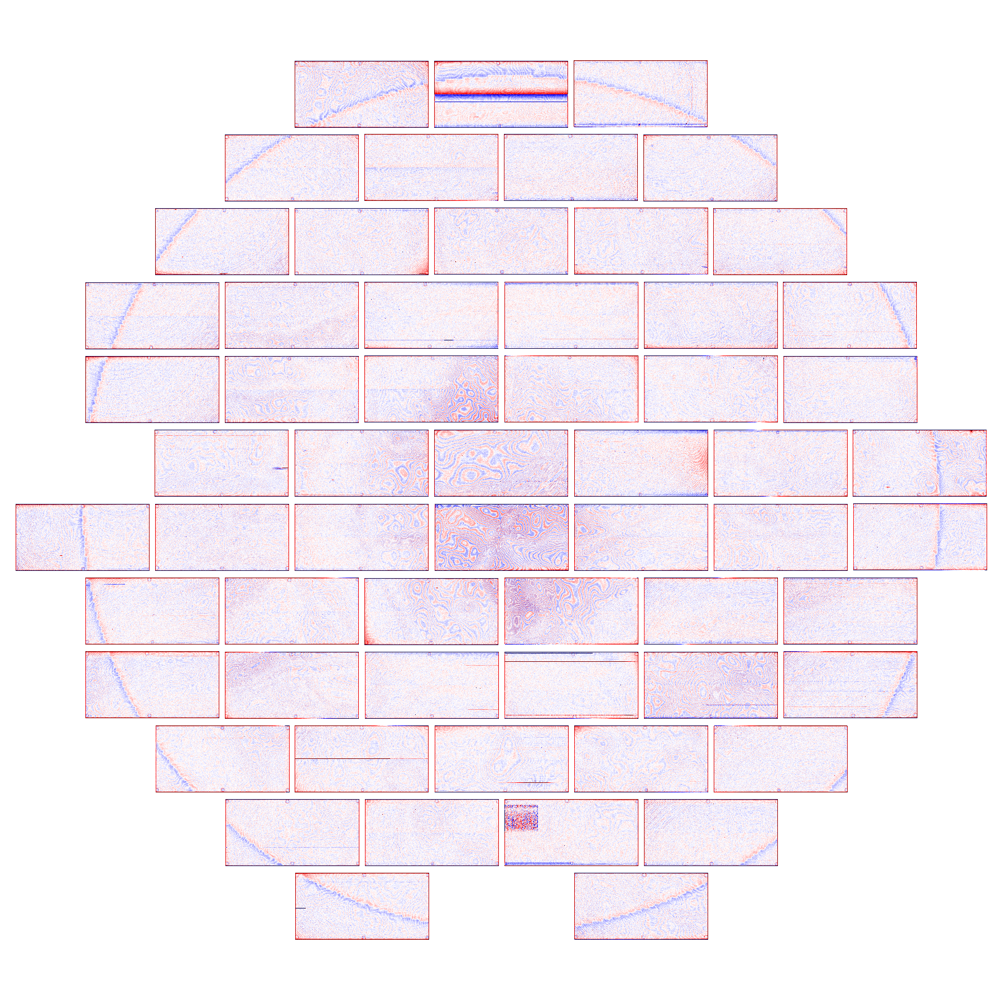

In [5]:
pix_size = 0.262/3600
vrange = 4e-3

plt.figure(figsize=(25, 25))

for ii, hdu_index in enumerate(image_hdu_list):
    
    if hdu_index==31:
        print('skipping S7')
        # sys.exit()
        continue
    
    ra, dec = ccd_ra[ii], ccd_dec[ii]
    
    # Load the new fringe image
    fringe = np.load(os.path.join(data_dir, 'fringe_{}.npy'.format(hdu_index)))

    fringe_small = fringe.copy()
    trim_size_y = 1
    trim_size_x = 0
    fringe_small = fringe_small[trim_size_y:(fringe_small.shape[0]-trim_size_y), trim_size_x:(fringe_small.shape[1]-trim_size_x)]
    ysize, xsize = fringe_small.shape
    binsize = 3
    fringe_small = fringe_small.reshape((fringe_small.shape[0]//binsize, binsize, fringe_small.shape[1]//binsize,-1)).mean(axis=3).mean(1)
    
    fig = plt.imshow(fringe_small.T, cmap='seismic', vmin=-vrange, vmax=vrange, 
               extent=(ra-ysize*pix_size/2, ra+ysize*pix_size/2, dec-xsize*pix_size/2, dec+xsize*pix_size/2))

plt.axis([1.1, -1.1, -1.1, 1.1])
plt.axis('off')
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('new_fringe_focal_plane.png')
plt.show()

__Old fringe image__

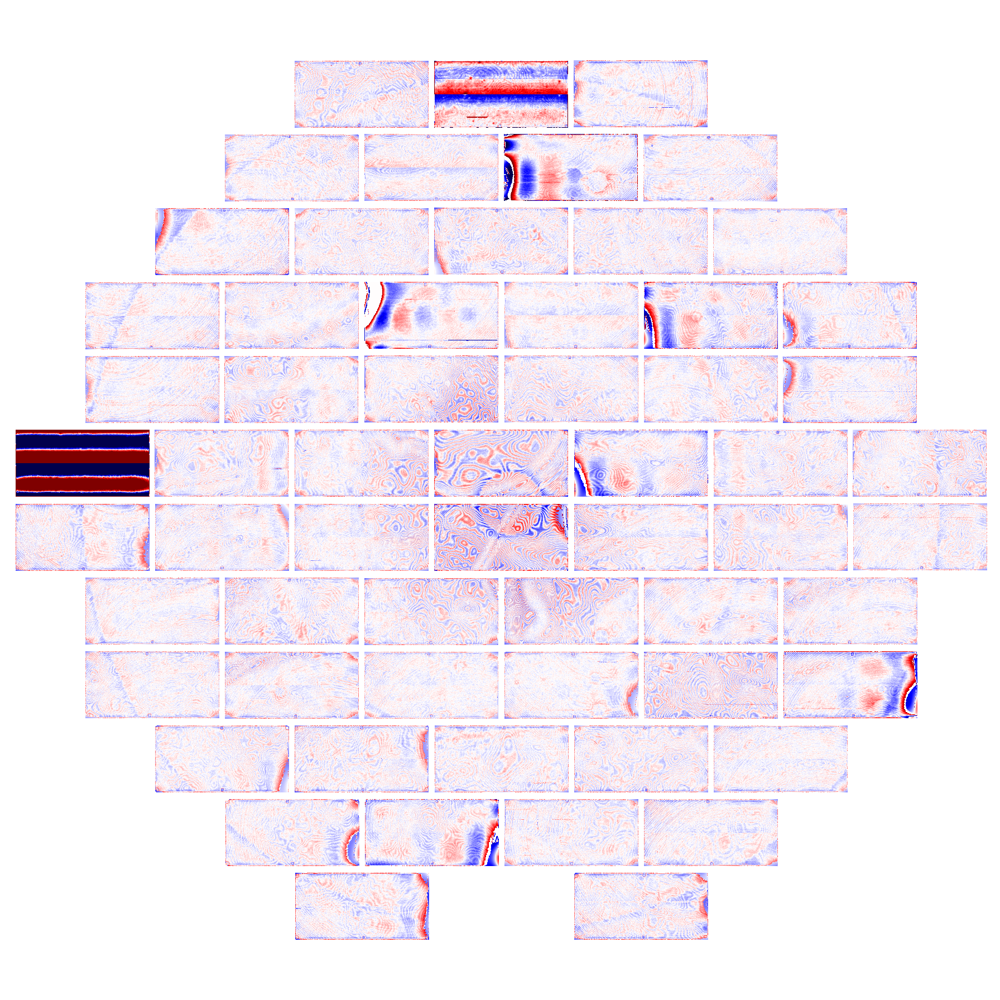

In [14]:
fringe_dir = '/global/homes/d/djschleg/cosmo/staging/decam/DECam_CP-Fringe'

pix_size = 0.262/3600
vrange = 4e-3

plt.figure(figsize=(25, 25))

for ii, hdu_index in enumerate(image_hdu_list):
    
    # if hdu_index==31:
    #     print('skipping S7')
    #     # sys.exit()
    #     continue
    
    ra, dec = ccd_ra[ii], ccd_dec[ii]

    # Load the old fringe image
    ccdnum = ccdnamenumdict[hdu2ccdname[hdu_index]]
    fringe_path = os.path.join(fringe_dir, 'DES17B_20180103_908c062-z-{}_frg.fits'.format(str(ccdnum).zfill(2)))
    fringe = fits.getdata(fringe_path)
    # remove the edge pixels
    fringe = fringe[1:4095, 1:2047]

    ysize, xsize = fringe.shape

    fig = plt.imshow(fringe.T, cmap='seismic', vmin=-vrange, vmax=vrange, 
               extent=(ra-ysize*pix_size/2, ra+ysize*pix_size/2, dec-xsize*pix_size/2, dec+xsize*pix_size/2))

plt.axis([1.1, -1.1, -1.1, 1.1])
plt.axis('off')
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('old_fringe_focal_plane.png')
plt.show()

__Difference__

skipping S7


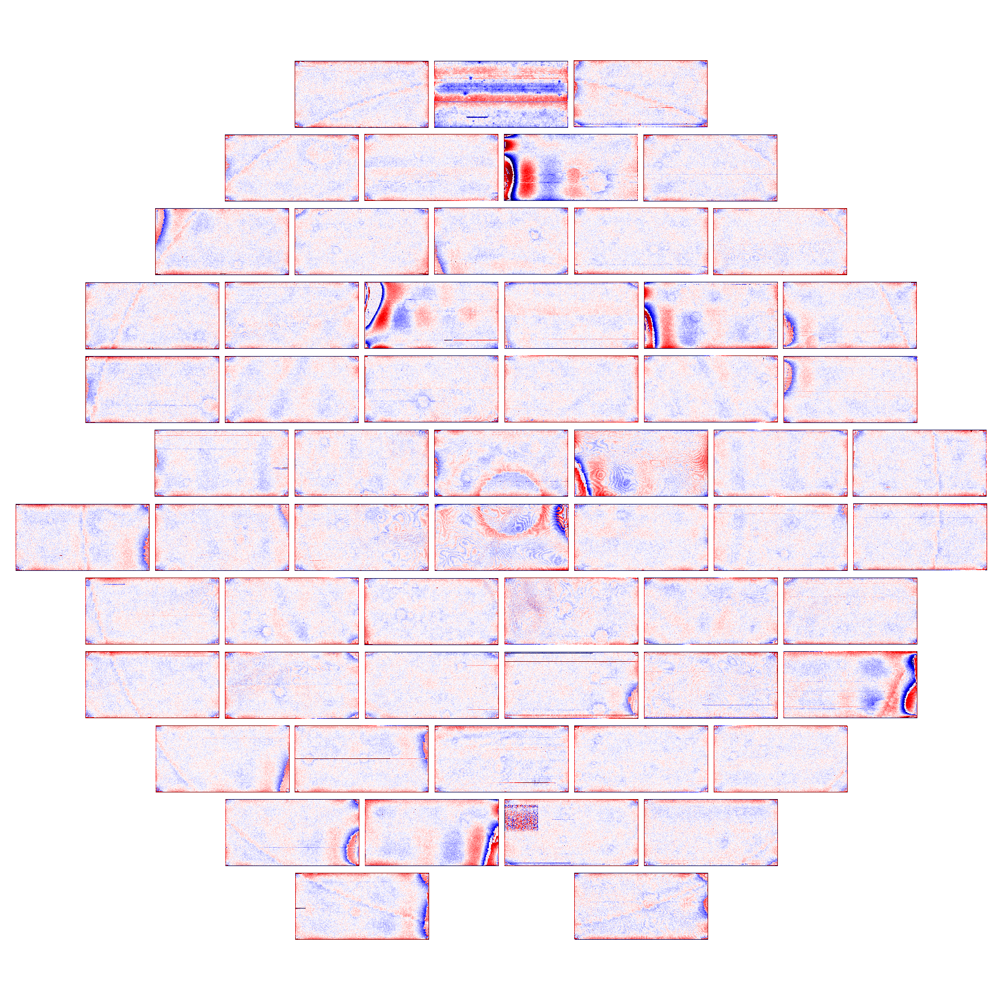

In [26]:
pix_size = 0.262/3600
vrange = 4e-3
norm_factor = 1.2

plt.figure(figsize=(25, 25))

for ii, hdu_index in enumerate(image_hdu_list):
    
    if hdu_index==31:
        print('skipping S7')
        # sys.exit()
        continue
    
    ra, dec = ccd_ra[ii], ccd_dec[ii]
    
    # Load the new fringe image
    fringe = np.load(os.path.join(data_dir, 'fringe_{}.npy'.format(hdu_index)))

    # Load the old fringe image
    ccdnum = ccdnamenumdict[hdu2ccdname[hdu_index]]
    fringe_path = os.path.join(fringe_dir, 'DES17B_20180103_908c062-z-{}_frg.fits'.format(str(ccdnum).zfill(2)))
    fringe_old = fits.getdata(fringe_path)
    # remove the edge pixels
    fringe_old = fringe_old[1:4095, 1:2047]

    fringe_diff = norm_factor*fringe - fringe_old

    fringe_diff_small = fringe_diff.copy()
    trim_size_y = 1
    trim_size_x = 0
    fringe_diff_small = fringe_diff_small[trim_size_y:(fringe_diff_small.shape[0]-trim_size_y), trim_size_x:(fringe_diff_small.shape[1]-trim_size_x)]
    ysize, xsize = fringe_diff_small.shape
    binsize = 3
    fringe_diff_small = fringe_diff_small.reshape((fringe_diff_small.shape[0]//binsize, binsize, fringe_diff_small.shape[1]//binsize,-1)).mean(axis=3).mean(1)
    
    fig = plt.imshow(fringe_diff_small.T, cmap='seismic', vmin=-vrange, vmax=vrange, 
               extent=(ra-ysize*pix_size/2, ra+ysize*pix_size/2, dec-xsize*pix_size/2, dec+xsize*pix_size/2))

plt.axis([1.1, -1.1, -1.1, 1.1])
plt.axis('off')
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('new-old_fringe_focal_plane.png')
plt.show()